In [1]:
import numpy as np
import copy
import netCDF4 as nc
import matplotlib
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import esmpy as ESMF
from scipy import stats
import xarray as xr
import pyart
import cmocean

Could not save font_manager cache [Errno 28] No space left on device



## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



In [2]:
def plot_map(clon,clat,lon,lat,var_val,vmin,vmax,cmap,norm,c_inc):

    ax = fig.add_subplot(spec[nrow,ncol], projection=ccrs.PlateCarree(central_longitude=-100))

    C = ax.pcolormesh(clon,clat,var_val, transform=ccrs.PlateCarree(),
                      cmap=cmap, norm=norm)
                                #vmin=vmin,vmax=vmax,cmap=cmap, norm=norm)
    
    levels = np.arange(vmin,vmax+c_inc/2.,c_inc)

    CS = ax.contour(lon,lat,var_val,levels, colors='k', transform=ccrs.PlateCarree())
                            
    ax.add_feature(cfeature.LAND,color='blanchedalmond',zorder=50)
    ax.coastlines(zorder=50)
    outline_nep_domain(ax,nep_clon,nep_clat)
            
    # ADDING GRID LINES AND GRID LABELS
    gl = ax.gridlines(draw_labels=True)
    
    gl.xlocator = mticker.FixedLocator([180, -150, -120])
    gl.ylocator = mticker.FixedLocator([25, 55])
    
    gl.xlabel_style = {'size': 20}
    gl.ylabel_style = {'size': 20}
    gl.bottom_labels = False
    gl.top_labels = False

        
    if ncol>0:
        gl.left_labels = False
        
    if ncol<2:
        gl.right_labels = False
    
    if nrow == 2:
        gl.bottom_labels = True
        
    plt.setp(ax.spines.values(), linewidth=2,zorder=100)
    
    # COLORBARS
    if dep == '200m':
        pos = ax.get_position()
        cbar_x = pos.x0
        
        pos_ref = plt.gcf().axes[6].get_position()
        cbar_h = .1*pos_ref.height
        cbar_y = pos_ref.y0 -.25*pos_ref.height
        
        if ncol == 1:
            cax = fig.add_axes([pos_ref.x0, cbar_y, 2*pos.width, cbar_h])
            cbar = plt.colorbar(C,cax=cax,orientation='horizontal',extend='both')
            cbar.ax.set_xticks(levels[::2])
            cax.plot([levels]*2, [0, 1], 'k')
            cbar.ax.tick_params(labelsize=16)
            cax.set_xlabel((variable_dict[variable]['c_title'] + ' ' + variable_dict[variable]['units']),fontsize=20)
            
        elif ncol == 3:
            cax = fig.add_axes([pos.x0, cbar_y, pos.width, cbar_h])
            cbar = plt.colorbar(C,cax=cax,orientation='horizontal',extend='both')
            cbar.ax.set_xticks(levels[::2])
            cax.plot([levels[levels>=0]]*2, [0, 1], 'k')
            cax.plot([levels[levels<0]]*2, [0, 1], '--k')
            cbar.ax.tick_params(labelsize=16)
            cax.set_xlabel(('Difference ' + variable_dict[variable]['units']),fontsize=20)
    # Labels
    if ncol == 0:
        plt_lab = depths_dict[dep]['plt_lab']   
        ax.text(243.0, 56, plt_lab, transform=ccrs.PlateCarree(), fontsize=25, ha='center', zorder=53)
    elif ncol == 3:
        stats_text = 'Bias: ' + f'{mean_bias:.2f}' + '\nRMSE: ' + f'{rmse:.2f}' + '\nMedAE: ' + f'{medae:.2f}' + '\nCorr: ' + f'{corr[0]:.2f}' 
        #ax.text(232.5, 59, stats_text, 
        #        fontsize=16, ha='left', va='center',transform=ccrs.PlateCarree(), zorder=53)
        ax.text(.03, .05, stats_text, ha="left", va="bottom", size=26, bbox=stats_box_props,transform=ax.transAxes)
    # Titles
    if (nrow == 0) or (nrow == 4):
        if ncol == 0:
            title_text = 'NEP10k'
        elif ncol == 1:
            title_text = 'CODAP-NA'
        else:
            title_text = 'NEP10k - CODAP-NA'
        
        ax.set_title(title_text, fontsize=30)
        
    ax.text(160,65, plot_labels[nlab], fontsize=25, ha='center', va='center',
            transform=ccrs.PlateCarree(),zorder=55)          
    # SET AXES EXTENT
    ax.set_extent([np.min(nep_clon),np.max(nep_clon),
                   np.min(nep_clat),70], crs=ccrs.PlateCarree())    


In [3]:
def get_model_ds(src_model):
    
    # CONSTRUCT FILE NAME
    ncfil = (mod_dict[src_model]['dir'] + variable_dict[variable][src_model]['file_name'])
            
    print(ncfil)
            
    # Open as xarray dataset
    ds = xr.open_dataset((ncfil),decode_times=False)
            
    if src_model == 'NEP':
        ds = ds.rename({'z_l':'depth'})
    elif src_model == 'Jiang':
        ds = ds.rename({'dep':'depth'})
        
    return ds

In [4]:
def get_coords(src_model,ds):
 
    if src_model == 'Jiang':
        lon = ds.longitude.values
        lat = ds.latitude.values

        depth = ds.depth.values

        # REGULARLY SPACED LAT/LON, can extrapolate outer corner bounds
        clon = (lon[:-1] + lon[1:])/2
        clat = (lat[:-1] + lat[1:])/2            
        clon = np.insert(np.insert(clon,0,2*clon[0]-clon[1]),-1,2*clon[-1]-clon[-2])
        clat = np.insert(np.insert(clat,0,2*clat[0]-clat[1]),-1,2*clat[-1]-clat[-2])
        

    elif src_model == 'NEP':
 
        lon = nep_lon
        lat = nep_lat
        clon = nep_clon 
        clat = nep_clat
        
    lons,lats = np.meshgrid(lon,lat)    
    chuk_mask = lats>66
    return lats,lons,clat,clon,chuk_mask

In [5]:
def create_regrid_obj(src_clon,src_clat,src_lsm,dst_clon,dst_clat):
    # Make 2D coordinates for remapping
    if len(src_clon.shape)<2:
        src_clon,src_clat = np.meshgrid(src_clon,src_clat)
        
    if len(dst_clon.shape)<2:
        dst_clon,dst_clat = np.meshgrid(dst_clon,dst_clat)
    
    sourcegrid = ESMF.Grid(np.array(src_lsm.shape), staggerloc = ESMF.StaggerLoc.CORNER,coord_sys = ESMF.CoordSys.SPH_DEG)
    sourcegrid.add_item(ESMF.GridItem.MASK,[ESMF.StaggerLoc.CENTER])
    grid_mask = sourcegrid.get_item(ESMF.GridItem.MASK)
    grid_mask[...] = src_lsm.astype(np.int32) 

    source_lon = sourcegrid.get_coords(0, staggerloc=ESMF.StaggerLoc.CORNER)
    source_lat = sourcegrid.get_coords(1, staggerloc=ESMF.StaggerLoc.CORNER)

    source_lon[...] = src_clon
    source_lat[...] = src_clat

    sourcefield = ESMF.Field(sourcegrid, name = 'src_field')
    srcfracfield = ESMF.Field(sourcegrid, 'srcfracfield')
        
    destgrid = ESMF.Grid(np.array(dst_clon[1:,1:].shape), staggerloc = ESMF.StaggerLoc.CORNER, coord_sys = ESMF.CoordSys.SPH_DEG)

    dest_clon = destgrid.get_coords(0,staggerloc=ESMF.StaggerLoc.CORNER)
    dest_clat = destgrid.get_coords(1,staggerloc=ESMF.StaggerLoc.CORNER)

    dest_clon[...] = dst_clon
    dest_clat[...] = dst_clat

    destfield = ESMF.Field(destgrid, name = 'dest_field')

    # DEFINE INTERPOLATION FUNCTION
    regrid = ESMF.Regrid(sourcefield, destfield,regrid_method = ESMF.RegridMethod.CONSERVE,
                     src_mask_values=np.array([0], dtype=np.int32),src_frac_field=srcfracfield,
                     norm_type=ESMF.NormType.FRACAREA,unmapped_action = ESMF.UnmappedAction.IGNORE)

    return sourcefield, destfield, regrid

In [6]:
def outline_nep_domain(ax,clon,clat):
    #NEP DOMAIN OUTLINE
    ax.plot(clon[0,:],clat[0,:],linewidth=1.5,color='k',transform=ccrs.PlateCarree(),zorder=42)
    ax.plot(clon[:,0],clat[:,0],linewidth=1.5,color='k',transform=ccrs.PlateCarree(),zorder=42)
    ax.plot(clon[-1,:],clat[-1,:],linewidth=1.5,color='k',transform=ccrs.PlateCarree(),zorder=42)
    ax.plot(clon[:,-1],clat[:,-1],linewidth=1.5,color='k',transform=ccrs.PlateCarree(),zorder=42)

In [7]:
def calc_stats(nep_val_stats, comp_val_stats, area_val):
    # CALCULATE STATISTICS
    nan_idx = ~np.isnan(nep_val_stats)*~np.isnan(comp_val_stats)
    
    # Mean Bias
    mean_bias = np.nanmean((nep_val_stats-comp_val_stats)[nan_idx])
    if print_stats:
        print('MEAN BIAS:', mean_bias)

    # Mean Bias Area Weighted
    mean_bias = np.nansum(((nep_val_stats*area_val)[nan_idx]-(comp_val_stats*area_val)[nan_idx])/np.nansum(area_val[nan_idx]))
    if print_stats:
        print('AREA-WEIGHTED MEAN BIAS:', mean_bias)

    # RMSE 
    rmse = np.sqrt(np.mean(((nep_val_stats-comp_val_stats)**2)[nan_idx]))
    if print_stats:
        print('RMSE:', rmse)

    # RMSE Area weighted
    rmse = np.sqrt(np.sum((((nep_val_stats-comp_val_stats)**2)*area_val)[nan_idx]/np.sum(area_val[nan_idx])))
    if print_stats:
        print('AREA-WEIGHTED RMSE:', rmse)
        
    # Median absolute error
    medae = np.nanmedian(np.abs(nep_val_stats-comp_val_stats)[nan_idx])
    if print_stats:
        print('MEDIAN ABSOLUTE ERROR:', medae)

    # Correlation
    corr = stats.pearsonr(nep_val_stats[nan_idx].ravel(), comp_val_stats[nan_idx].ravel())
    if print_stats:
        print('CORRELATION:', corr)
    
    return mean_bias, rmse, medae, corr

In [8]:
mod_dict = {'NEP':{'dir':'/work/role.medgrp/NEP/plotting/Figure_14_15_16/',},
            'Jiang':{'dir':'/work/role.medgrp/NEP/plotting/Figure_14_15_16/'}}

# DEPTHS
depths_dict = {'surface': {'NEP':{'val':2.5},'Jiang':{'val':0}, 'plt_lab':'Surface'}, 
               '100m':    {'NEP':{'val':100},'Jiang':{'val':6}, 'plt_lab':'100m'},
               '200m':    {'NEP':{'val':200},'Jiang':{'val':9}, 'plt_lab':'200m'}}

variable_dict = {'Alkalinity':{'NEP':{'file_name':'nep_talk_2004-2018_mean.nc', 'var_nm':'talk','k':(1000*1000)/1024},
                               'Jiang':{'file_name':'TA.nc','var_nm':'TA_an','k':1}, 
                               'units':r'($\mu$mol kg$^{-1}$)', 'c_title': 'Total Alkalinity',
                               'vmin':2100,'vmax':2400,'cbar_n':25, 'inc':25, 
                               'dif_range':100, 'dif_cbar_n':17, 'dif_inc':25},
                 
                 'DIC':{'NEP':{'file_name':'nep_dissic_2004-2018_mean.nc','var_nm':'dissic','k':(1000*1000)/1024},
                        'Jiang':{'file_name':'DIC.nc','var_nm':'DIC_an','k':1},
                        'units':r'($\mu$mol kg$^{-1}$)', 'c_title': 'Dissolved Inorganic Carbon',
                        'vmin':1900,'vmax':2300,'cbar_n':25, 'inc':50, 
                        'dif_range':100, 'dif_cbar_n':17, 'dif_inc':25},
                 
                 'Arag_sat':{'NEP':{'file_name':'nep_omega_arag_2004-2018_mean.nc','var_nm':'omega_arag','k':1},
                             'Jiang':{'file_name':'Aragonite_saturation_state.nc','var_nm':'OmegaA_an','k':1},
                             'units':'','c_title': 'Aragonite Saturation State',
                             'vmin':0.5,'vmax':4.5,'cbar_n':25, 'inc':.5, 
                             'dif_range':1, 'dif_cbar_n':17, 'dif_inc':0.25},}

cmap1 = mpl.cm.gist_rainbow_r
bounds = np.linspace(32,35,25)
norm1 = mcolors.BoundaryNorm(bounds, cmap1.N, extend='both')

cmap2 = mpl.cm.seismic
bounds = np.linspace(-1,1,17)
norm2 = mcolors.BoundaryNorm(bounds, cmap2.N, extend='both')
plot_labels = ['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p','q','r']

In [9]:
# NEP Grid
nep_grd_fil = '/work/role.medgrp/NEP/plotting/shared_files/NEP_ocean_static_nomask.nc'
grd_fid = nc.Dataset(nep_grd_fil)

# Extracting tracer lat/lon from the supergrid
nep_lat = grd_fid.variables['geolat'][:]
nep_lon = grd_fid.variables['geolon'][:]

# Extracting tracer corner lat/lon from the supergrid - needed for regridding and pcolor plots
nep_clat = grd_fid.variables['geolat_c'][:]
nep_clon = grd_fid.variables['geolon_c'][:]

nep_depth = grd_fid.variables['deptho'][:]

lsm = grd_fid.variables['wet'][:]
lsm[lsm<1]=0 
lsm[lsm>1]=1 

nep_area = grd_fid.variables['areacello'][:].squeeze()
nep_area[lsm<.5]=0

/work/role.medgrp/NEP/plotting/Figure_14_15_16/nep_talk_2004-2018_mean.nc
/work/role.medgrp/NEP/plotting/Figure_14_15_16/TA.nc
surface
MEAN BIAS: 23.845539473352336
AREA-WEIGHTED MEAN BIAS: 23.410637881671875
RMSE: 27.304160825459036
AREA-WEIGHTED RMSE: 26.94808459200288
MEDIAN ABSOLUTE ERROR: 19.694000011748358
CORRELATION: PearsonRResult(statistic=0.963354361714001, pvalue=0.0)
100m
MEAN BIAS: 32.679392058473844
AREA-WEIGHTED MEAN BIAS: 33.08382415375151
RMSE: 35.16502302044344
AREA-WEIGHTED RMSE: 35.58746458391295
MEDIAN ABSOLUTE ERROR: 32.31690044760626
CORRELATION: PearsonRResult(statistic=0.9244000697193477, pvalue=0.0)
200m
MEAN BIAS: 31.31961894816031
AREA-WEIGHTED MEAN BIAS: 31.684951859767345
RMSE: 32.67518407449148
AREA-WEIGHTED RMSE: 32.985850241443664
MEDIAN ABSOLUTE ERROR: 33.3839022439206
CORRELATION: PearsonRResult(statistic=0.8488026683919329, pvalue=0.0)
/work/role.medgrp/NEP/plotting/Figure_14_15_16/nep_dissic_2004-2018_mean.nc
/work/role.medgrp/NEP/plotting/Figure_1

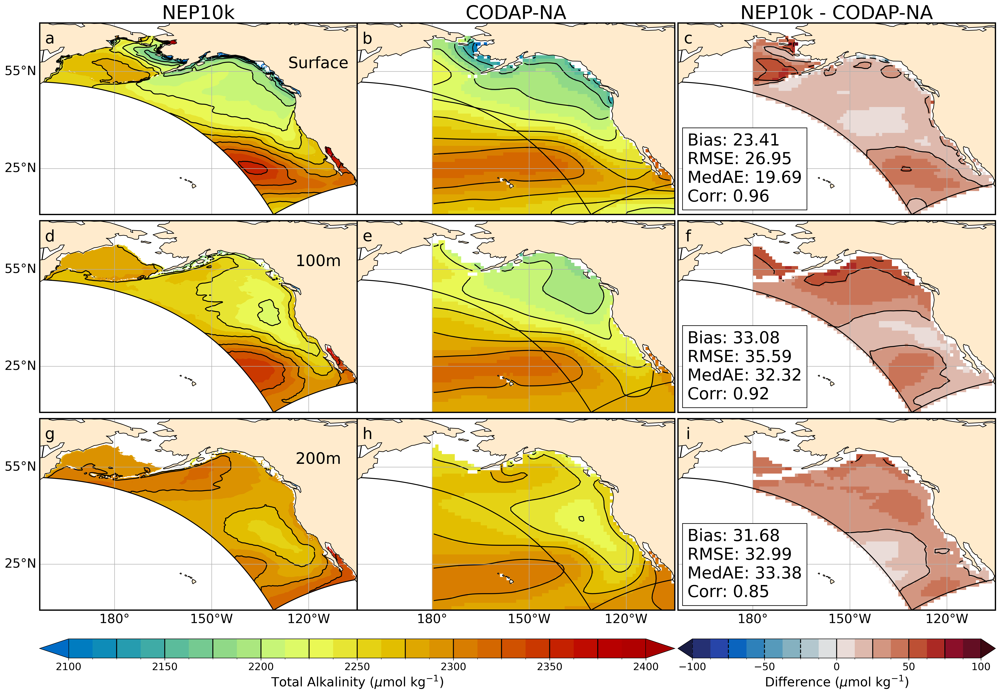

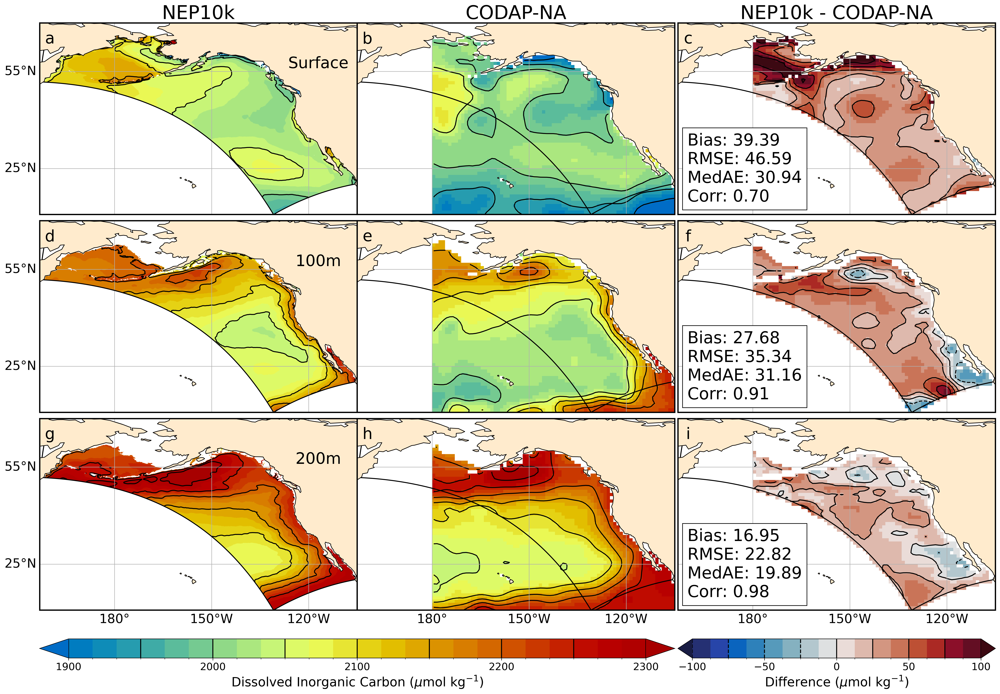

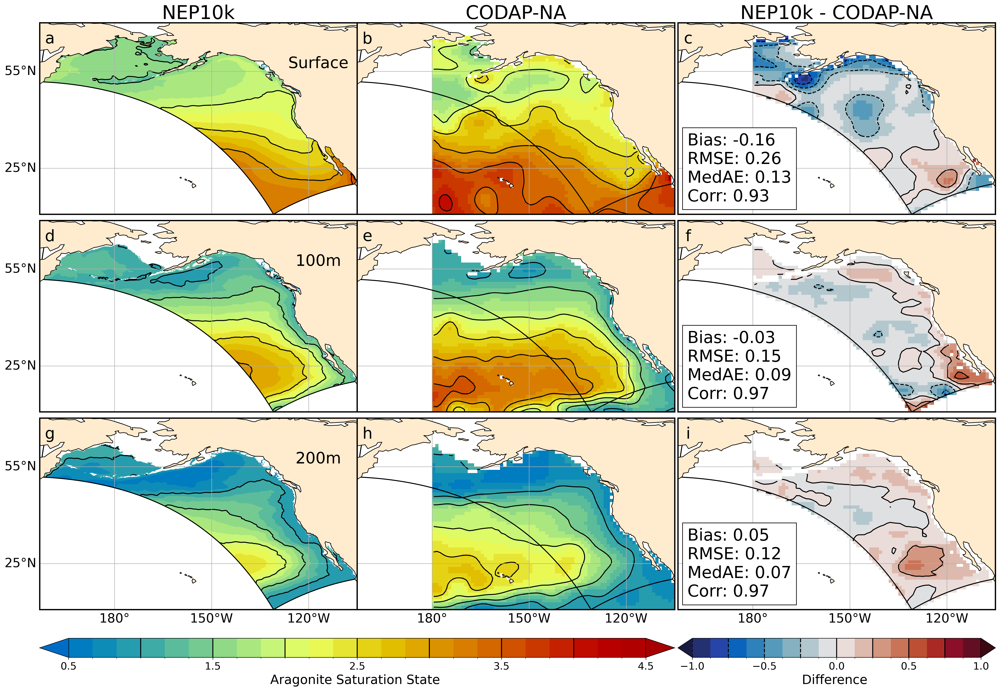

In [10]:
print_stats=True
heights = [10,10,10,2]
widths = [10,10,.1,10]
stats_box_props = dict(boxstyle="square", fc="w", ec="0.0", alpha=1)
#
fig_n = 14
for variable in ['Alkalinity','DIC','Arag_sat']:
#for variable in ['Alkalinity']:
    fig = plt.figure(figsize=(27,18),dpi=300)

    # Colormaps
    
    cmap1 = 'pyart_HomeyerRainbow'
    bounds = np.linspace(variable_dict[variable]['vmin'],
                         variable_dict[variable]['vmax'],
                         variable_dict[variable]['cbar_n'])
    norm1 = mcolors.BoundaryNorm(bounds, 256, extend='both')

    cmap2 = cmocean.cm.balance
    bounds = np.linspace(-variable_dict[variable]['dif_range'],
                         variable_dict[variable]['dif_range'],
                         variable_dict[variable]['dif_cbar_n'])

    norm2 = mcolors.BoundaryNorm(bounds, cmap2.N, extend='both')

    spec = fig.add_gridspec(ncols=4, nrows=4,wspace=0,hspace=0.,height_ratios=heights, width_ratios=widths)  
    nrow = 0
    nlab = 0
    
    ds_NEP = get_model_ds('NEP')
    ds_comp = get_model_ds('Jiang')  
    lat,lon,clat,clon,chuk_mask = get_coords('Jiang',ds_comp)
    #sourcefield, destfield, regrid, lsm_out, area_out = create_regrid_obj()
    sourcefield, destfield, regrid = create_regrid_obj(nep_clon,nep_clat,lsm,clon,clat)
    const_offset = np.nanmax(lsm) + 10
    sourcefield.data[...] = lsm + const_offset
    destfield = regrid(sourcefield, destfield)
    tmp_val = copy.deepcopy(destfield.data)
    tmp_val[tmp_val==0] = np.nan
    lsm_out = tmp_val - const_offset
    lsm_out[lsm_out>.5]=1
    lsm_out[lsm_out<.5]=0

    # Get area for weighted statistics 
    const_offset = np.nanmax(nep_area) + 10
    sourcefield.data[...] = nep_area + const_offset
    destfield = regrid(sourcefield, destfield)
    tmp_val = copy.deepcopy(destfield.data)
    tmp_val[tmp_val==0] = np.nan
    area_out = tmp_val - const_offset

    for dep,nrow in zip(depths_dict,range(len(depths_dict))):
        ncol=0
        print(dep)

        # Interpolate depth values 
        comp_val = variable_dict[variable]['Jiang']['k']*ds_comp[variable_dict[variable]['Jiang']['var_nm']].isel(depth=depths_dict[dep]['Jiang']['val']).values.squeeze()
        NEP_val = variable_dict[variable]['NEP']['k']*ds_NEP[variable_dict[variable]['NEP']['var_nm']].interp(depth=depths_dict[dep]['NEP']['val']).values.squeeze()
        NEP_val[nep_depth<=depths_dict[dep]['NEP']['val']] = np.nan

        const_offset = np.nanmax(NEP_val)+10
        sourcefield.data[...] = NEP_val + const_offset
        destfield = regrid(sourcefield, destfield)
        tmp_val = copy.deepcopy(destfield.data)
        tmp_val[tmp_val==0] = np.nan
        NEP_val_out = tmp_val - const_offset
        
        comp_val[comp_val<0]=np.nan
        NEP_val_out[lsm_out==0]=np.nan
        NEP_val_out[chuk_mask]=np.nan
        
        nan_idx = ~np.isnan(NEP_val_out)*~np.isnan(comp_val)
            
        # Add subplot map to figure
        NEP_val[nep_lat>66]=np.nan
        plot_map(nep_clon,nep_clat,nep_lon,nep_lat,NEP_val,
                    variable_dict[variable]['vmin'],
                    variable_dict[variable]['vmax'],
                    cmap1,norm1,
                    variable_dict[variable]['inc'])
            
        ncol+=1
        nlab+=1
        comp_val[lat>66]=np.nan    
        plot_map(clon,clat,lon,lat,comp_val,
                    variable_dict[variable]['vmin'],
                    variable_dict[variable]['vmax'],
                    cmap1,norm1,
                    variable_dict[variable]['inc'])
        ncol+=2
        nlab+=1

        # CALCULATE STATISTICS
        mean_bias, rmse, medae, corr = calc_stats(NEP_val_out,comp_val,area_out)

        plot_map(clon,clat,lon,lat,NEP_val_out-comp_val,
                    -variable_dict[variable]['dif_range'],
                    variable_dict[variable]['dif_range'],
                    cmap2,norm2,
                    variable_dict[variable]['dif_inc'])
            
        nlab+=1
                
    fig_file_name = 'Figure'+ str(fig_n) + '_' + variable + '_NEP_vs_CODAP-NA' 
    fig_n+=1
    plt.savefig(fig_file_name)
            